**Averaged Integrated Gradients**

My first attempt to explore the effectiveness of using averaged integrated gradients to improve attribution.
The idea is to find multiple useful reference points $x_0$ to the Taylor approximation which can help to explain the model's prediction, and act as additional baselines to the integrated gradient computation.

The scope of this exploration include:
- Focus first on multi-class image classification problem context
- Use pre-existing trained neural models in PyTorch
- Use implemented attack models in FoolBox

In [34]:
import numpy as np
import torch
from torchvision import models
dir(models)   # list of pre-existing trained vision classification neural models
# ['AlexNet', 'DenseNet', 'GoogLeNet', 'GoogLeNetOutputs', 'Inception3', 'InceptionOutputs', 'MNASNet', 'MobileNetV2', 'ResNet', 'ShuffleNetV2', 'SqueezeNet', 'VGG', '_GoogLeNetOutputs', '_InceptionOutputs', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '_utils', 'alexnet', 'densenet', 'densenet121', 'densenet161', 'densenet169', 'densenet201', 'detection', 'googlenet', 'inception', 'inception_v3', 'mnasnet', 'mnasnet0_5', 'mnasnet0_75', 'mnasnet1_0', 'mnasnet1_3', 'mobilenet', 'mobilenet_v2', 'quantization', 'resnet', 'resnet101', 'resnet152', 'resnet18', 'resnet34', 'resnet50', 'resnext101_32x8d', 'resnext50_32x4d', 'segmentation', 'shufflenet_v2_x0_5', 'shufflenet_v2_x1_0', 'shufflenet_v2_x1_5', 'shufflenet_v2_x2_0', 'shufflenetv2', 'squeezenet', 'squeezenet1_0', 'squeezenet1_1', 'utils', 'vgg', 'vgg11', 'vgg11_bn', 'vgg13', 'vgg13_bn', 'vgg16', 'vgg16_bn', 'vgg19', 'vgg19_bn', 'video', 'wide_resnet101_2', 'wide_resnet50_2']
key_models = ['alexnet', 'densenet121', 'googlenet', 'mobilenet_v2', 'squeezenet1_0']

In [22]:
import foolbox
dir(foolbox.attacks)
#['ADefAttack', 'AdamL1BasicIterativeAttack', 'AdamL2BasicIterativeAttack', 'AdamPGD', 'AdamProjectedGradientDescent', 'AdamProjectedGradientDescentAttack', 'AdamRandomPGD', 'AdamRandomProjectedGradientDescent', 'AdamRandomStartProjectedGradientDescentAttack', 'AdditiveGaussianNoiseAttack', 'AdditiveNoiseAttack', 'AdditiveUniformNoiseAttack', 'Attack', 'BIM', 'BasicIterativeMethod', 'BinarizationRefinementAttack', 'BlendedUniformNoiseAttack', 'BoundaryAttack', 'BoundaryAttackPlusPlus', 'CarliniWagnerL2Attack', 'ContrastReductionAttack', 'DecoupledDirectionNormL2Attack', 'DeepFoolAttack', 'DeepFoolL2Attack', 'DeepFoolLinfinityAttack', 'EADAttack', 'FGSM', 'GaussianBlurAttack', 'GenAttack', 'GradientAttack', 'GradientSignAttack', 'HopSkipJumpAttack', 'InversionAttack', 'IterativeGradientAttack', 'IterativeGradientSignAttack', 'L1BasicIterativeAttack', 'L2BasicIterativeAttack', 'LinfinityBasicIterativeAttack', 'LocalSearchAttack', 'MomentumIterativeAttack', 'MomentumIterativeMethod', 'NewtonFoolAttack', 'PGD', 'PointwiseAttack', 'PrecomputedAdversarialsAttack', 'ProjectedGradientDescent', 'ProjectedGradientDescentAttack', 'RandomPGD', 'RandomProjectedGradientDescent', 'RandomStartProjectedGradientDescentAttack', 'SaliencyMapAttack', 'SaltAndPepperNoiseAttack', 'SinglePixelAttack', 'SparseL1BasicIterativeAttack', 'SpatialAttack', 'VirtualAdversarialAttack', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', 'additive_noise', 'adef_attack', 'base', 'binarization', 'blended_noise', 'blur', 'boundary_attack', 'carlini_wagner', 'contrast', 'decoupled_direction_norm', 'deepfool', 'ead', 'gen', 'gradient', 'hop_skip_jump_attack', 'inversion', 'iterative_gradient', 'iterative_projected_gradient', 'localsearch', 'newtonfool', 'pointwise', 'precomputed', 'saliency', 'saltandpepper', 'spatial', 'virtual_adversarial']
key_attacks = [ # Gradient-based atttack
               'GradientSignAttack',                 # FGSM ~ 10 s
               #'BasicIterativeMethod',               # BIM ~ 200s
               #'ProjectedGradientDescentAttack',     # PGD ~ 760s
               #'RandomPGD',                          # takes a while; run overnight?
               #'AdamPGD',                            # takes a while; run overnight?
               #'MomentumIterativeAttack',            #  ~ 250s
               'DeepFoolAttack',                     # ~ 15s
               'NewtonFoolAttack',                   # ~ 6s
               #'CarliniWagnerL2Attack',              # takes a while; run overnight?
               #'DecoupledDirectionNormL2Attack',     # ~ 120s
               #'SparseL1BasicIterativeAttack',       # ~ 190s
               #'VirtualAdversarialAttack',           # ~ 45s ; different adversarials

               # Score-based attacks
               #'SinglePixelAttack',                  # takes a while; run overnight?
               #'LocalSearchAttack',                  # takes a while; run overnight?

               # Decision-based attacks
               #'SpatialAttack',                      # takes a while; run overnight?
               #'PointwiseAttack',                    # takes a while; run overnight?
               'GaussianBlurAttack',                 # ~ 6s
               #'ContrastReductionAttack',            # ~ 270s
               #'AdditiveUniformNoiseAttack',         # ~ 170s ; different adversarials
               #'AdditiveGaussianNoiseAttack',        # ~ 190s ; different adversarials
               #'SaltAndPepperNoiseAttack',           # ~ 240s ; different adversarials
               #'BlendedUniformNoiseAttack',          # ~ 115s ; different adversarials
               #'HopSkipJumpAttack',

               # Others
               'BinarizationRefinementAttack',       # < 1s ; different adversarials (~25% effective)
               'InversionAttack'                     # ~ 2s ; different adversarials (~75% effective)
               ]

In [81]:
# create toy sample dataset from ImageNet
images, labels = foolbox.utils.samples(dataset='imagenet', batchsize=16, data_format='channels_first', bounds=(0, 1))
preprocessing = dict(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], axis=-3)
with open('imagenet_classes.txt') as f:
    classes = [line.strip() for line in f.readlines()]

In [82]:
# setup visualization
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import display
from captum.attr import IntegratedGradients
import igvisual

def plot(image, adversarial):
    # transpose CHW to HWC
    image = image.transpose(1, 2, 0)
    adversarial = adversarial.transpose(1, 2, 0)

    plt.figure()
    plt.subplot(1, 3, 1)
    plt.title('Original')
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Adversarial')
    plt.imshow(adversarial)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Difference')
    difference = adversarial - image
    plt.imshow(difference / abs(difference).max()) # * 0.2 + 0.5)
    plt.axis('off')

    plt.show()

In [97]:
# exploratory analysis
def explore(pre_trained_model, attack_model):    
    # instantiate the PyTorch model in Foolbox
    fmodel = foolbox.models.PyTorchModel(
        pre_trained_model,
        bounds=(0, 1),
        num_classes=1000,
        preprocessing=preprocessing
    )

    # current model accuray
    success = fmodel.forward(images).argmax(axis=-1) == labels
    print('Initial accuracy: %.2f (%d/16)' % (np.mean(success), np.sum(success)))

    # apply the attack
    print('Foolbox attack model:', attack_model)
    attacker = eval('foolbox.attacks.%s(fmodel)' % attack)
    adversarials = attacker(images, labels)
    failures = sum([np.isnan(np.sum(ad)) for ad in adversarials])  # np.isnan if no adversarial is found
    print('Failed adversarials: %d/%d' % (failures, np.sum(success)))
    
    # plot the integrated gradients
    ig = IntegratedGradients(pre_trained_model)
    baseline1 = torch.zeros(1, 3, 224, 224)  # black image
    for i, image in enumerate(images):
        adversarial = adversarials[i]
        plot(image, adversarial)
        # perform classification
        predicted = fmodel.forward(np.expand_dims(image, 0)).argmax(axis=-1)[0]
        print('label:', classes[labels[i]])
        print('prediction before attack:', classes[predicted])
        if adversarial.all() == np.nan:
            print('attack failed')
            continue
        print('prediction after attack:', classes[fmodel.forward(np.expand_dims(adversarial, 0)).argmax(axis=-1)[0]])

        # calculate integrated gradients using standard baseline
        img_t = torch.unsqueeze(torch.from_numpy(image), 0)
        attributions, approximation_error = ig.attribute(torch.tensor(img_t, requires_grad=True),
                                                         baselines=(baseline1,),
                                                         method='gausslegendre',
                                                         target=torch.tensor(predicted),
                                                         return_convergence_delta=True)
        attributions = np.transpose(np.squeeze(attributions.detach().numpy()), (2, 1, 0))
        compare_img = np.transpose(image, (2, 1, 0))
        visual = igvisual.pil_image(igvisual.Visualize(attributions,
                                                       compare_img,
                                                       clip_above_percentile=99,
                                                       clip_below_percentile=0,
                                                       overlay=True))
        display(visual)
        
        if labels[i] != predicted:
            # no attack needed
            continue
        # calculate integrated gradients using adversarial as baseline
        attributions, approximation_error = ig.attribute(torch.tensor(img_t, requires_grad=True),
                                                         baselines=(torch.tensor(np.expand_dims(adversarial, 0)),),
                                                         method='gausslegendre',
                                                         target=torch.tensor(predicted),
                                                         return_convergence_delta=True)
        attributions = np.transpose(np.squeeze(attributions.detach().numpy()), (2, 1, 0))
        visual = igvisual.pil_image(igvisual.Visualize(attributions,
                                                       compare_img,
                                                       clip_above_percentile=99,
                                                       clip_below_percentile=0,
                                                       overlay=True))
        display(visual)

Using model: alexnet
AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_featur

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide


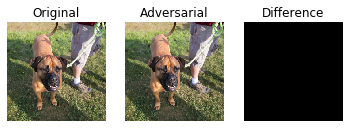

label: bull mastiff
prediction before attack: boxer
prediction after attack: boxer


/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


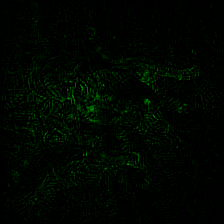

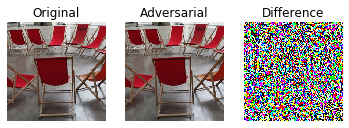

label: folding chair
prediction before attack: folding chair
prediction after attack: dining table, board


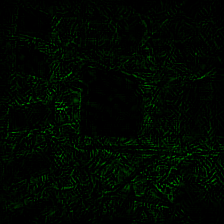

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:57: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


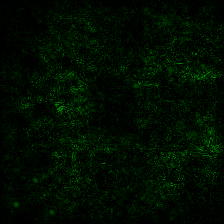

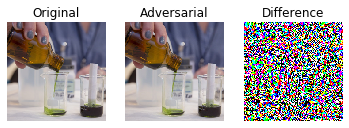

label: beaker
prediction before attack: beaker
prediction after attack: perfume, essence


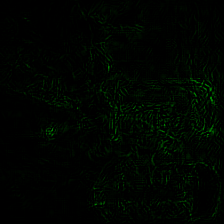

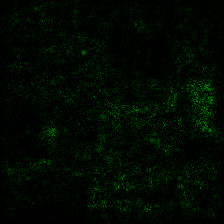

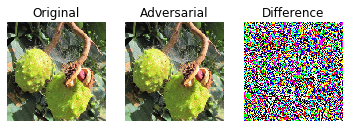

label: buckeye, horse chestnut, conker
prediction before attack: buckeye, horse chestnut, conker
prediction after attack: hip, rose hip, rosehip


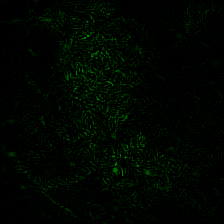

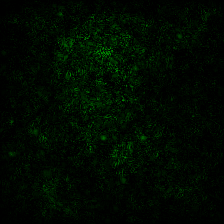

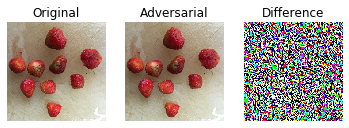

label: strawberry
prediction before attack: strawberry
prediction after attack: bottlecap


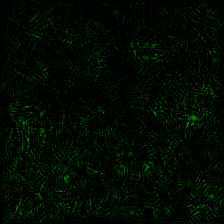

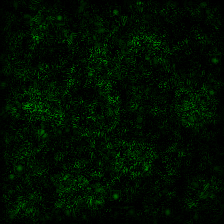

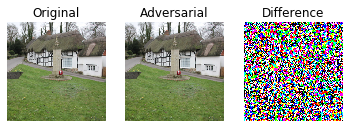

label: thatch, thatched roof
prediction before attack: thatch, thatched roof
prediction after attack: mobile home, manufactured home


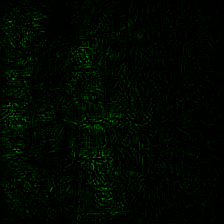

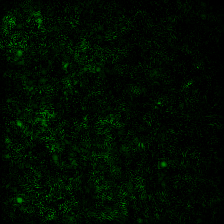

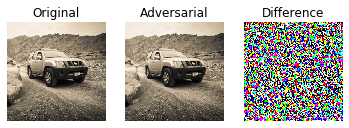

label: jeep, landrover
prediction before attack: jeep, landrover
prediction after attack: racer, race car, racing car


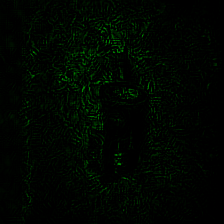

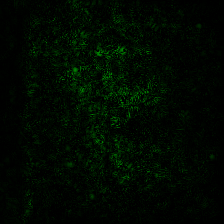

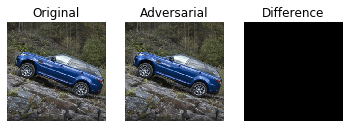

label: jeep, landrover
prediction before attack: racer, race car, racing car
prediction after attack: racer, race car, racing car


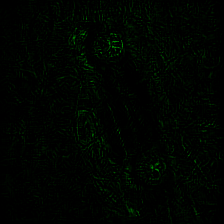

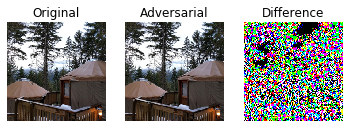

label: yurt
prediction before attack: yurt
prediction after attack: apiary, bee house


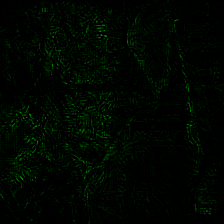

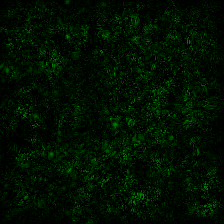

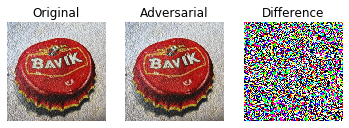

label: bottlecap
prediction before attack: bottlecap
prediction after attack: doormat, welcome mat


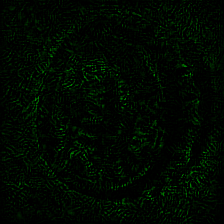

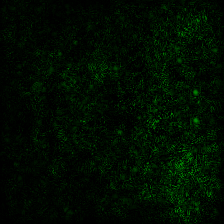

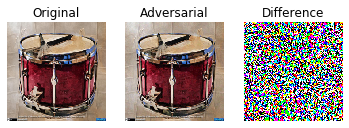

label: drum, membranophone, tympan
prediction before attack: drum, membranophone, tympan
prediction after attack: mailbag, postbag


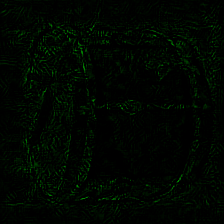

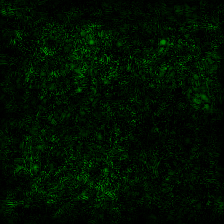

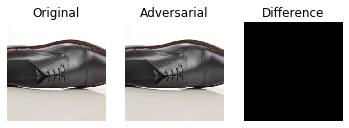

label: Loafer
prediction before attack: sunglasses, dark glasses, shades
prediction after attack: sunglasses, dark glasses, shades


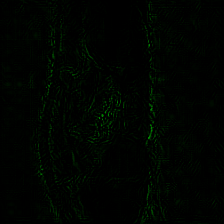

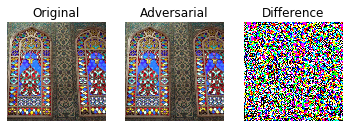

label: prayer rug, prayer mat
prediction before attack: prayer rug, prayer mat
prediction after attack: bottlecap


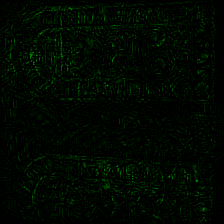

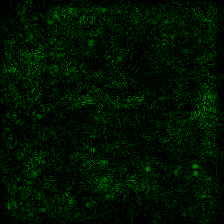

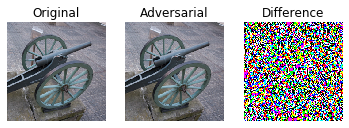

label: cannon
prediction before attack: cannon
prediction after attack: manhole cover


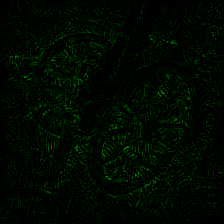

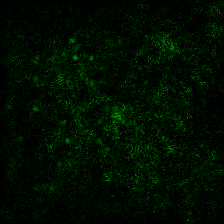

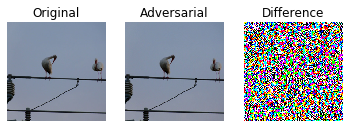

label: spoonbill
prediction before attack: spoonbill
prediction after attack: white stork, Ciconia ciconia


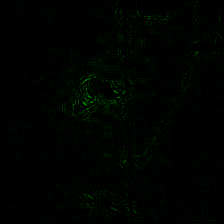

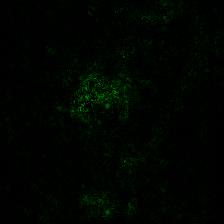

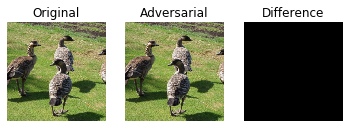

label: goose
prediction before attack: vulture
prediction after attack: vulture


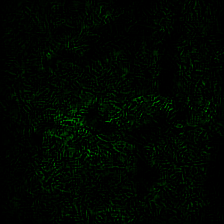

Initial accuracy: 0.75 (12/16)
Foolbox attack model: DeepFoolAttack
Failed adversarials: 0/12


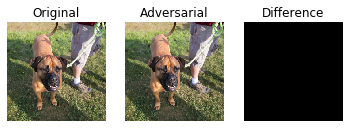

label: bull mastiff
prediction before attack: boxer
prediction after attack: boxer


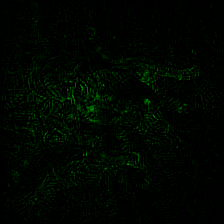

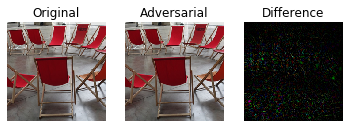

label: folding chair
prediction before attack: folding chair
prediction after attack: dining table, board


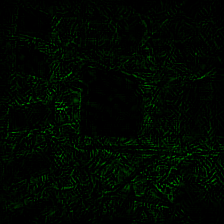

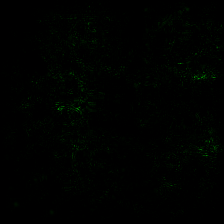

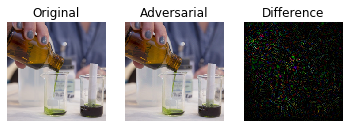

label: beaker
prediction before attack: beaker
prediction after attack: perfume, essence


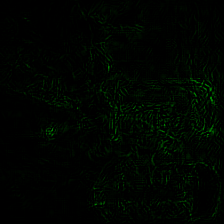

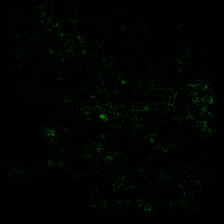

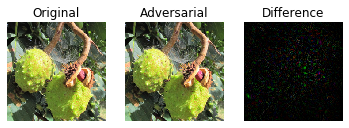

label: buckeye, horse chestnut, conker
prediction before attack: buckeye, horse chestnut, conker
prediction after attack: hip, rose hip, rosehip


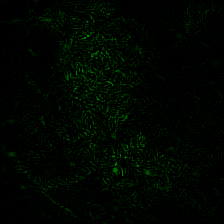

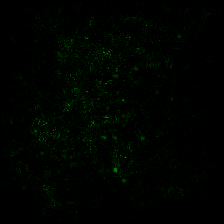

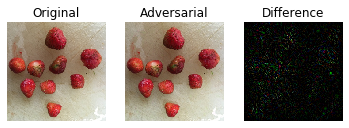

label: strawberry
prediction before attack: strawberry
prediction after attack: bottlecap


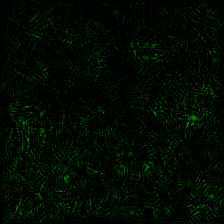

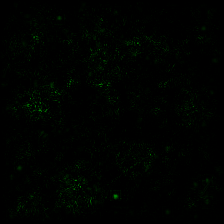

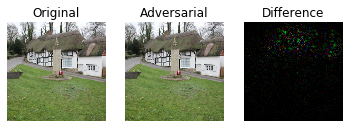

label: thatch, thatched roof
prediction before attack: thatch, thatched roof
prediction after attack: mobile home, manufactured home


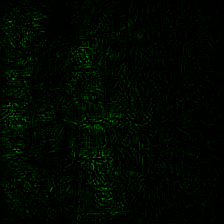

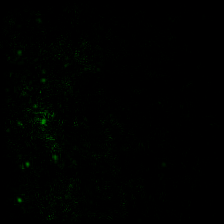

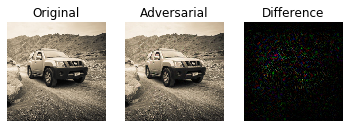

label: jeep, landrover
prediction before attack: jeep, landrover
prediction after attack: racer, race car, racing car


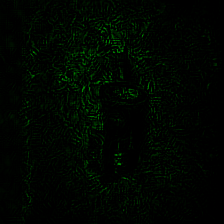

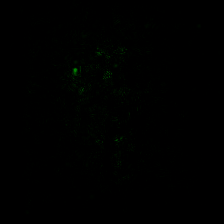

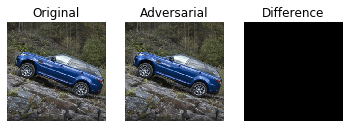

label: jeep, landrover
prediction before attack: racer, race car, racing car
prediction after attack: racer, race car, racing car


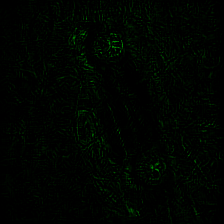

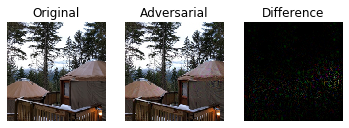

label: yurt
prediction before attack: yurt
prediction after attack: apiary, bee house


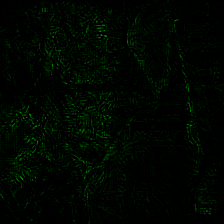

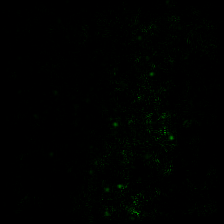

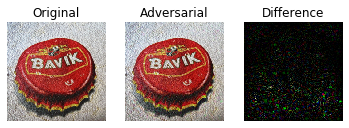

label: bottlecap
prediction before attack: bottlecap
prediction after attack: wallet, billfold, notecase, pocketbook


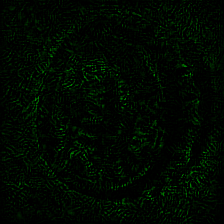

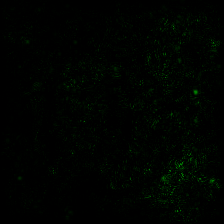

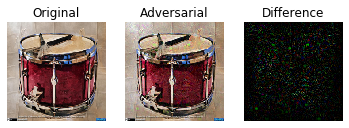

label: drum, membranophone, tympan
prediction before attack: drum, membranophone, tympan
prediction after attack: accordion, piano accordion, squeeze box


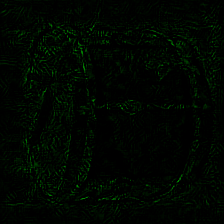

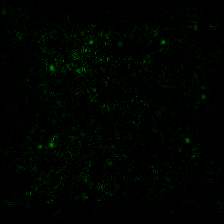

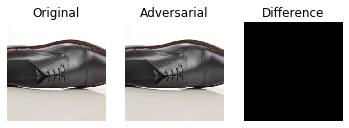

label: Loafer
prediction before attack: sunglasses, dark glasses, shades
prediction after attack: sunglasses, dark glasses, shades


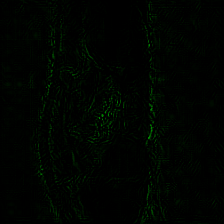

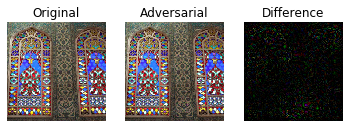

label: prayer rug, prayer mat
prediction before attack: prayer rug, prayer mat
prediction after attack: bottlecap


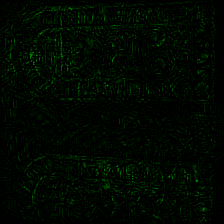

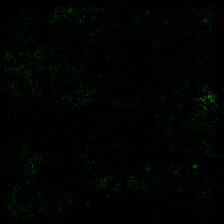

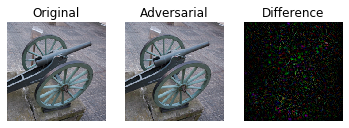

label: cannon
prediction before attack: cannon
prediction after attack: manhole cover


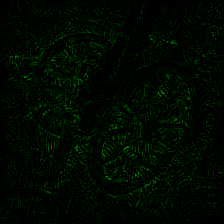

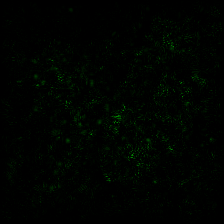

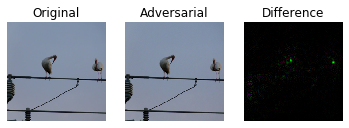

label: spoonbill
prediction before attack: spoonbill
prediction after attack: white stork, Ciconia ciconia


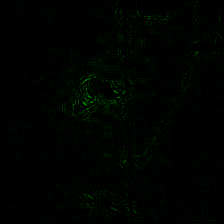

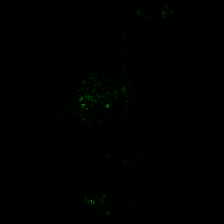

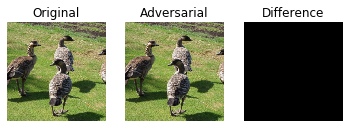

label: goose
prediction before attack: vulture
prediction after attack: vulture


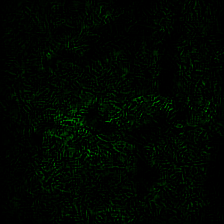

Initial accuracy: 0.75 (12/16)
Foolbox attack model: NewtonFoolAttack
Failed adversarials: 0/12


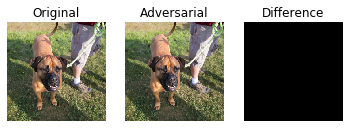

label: bull mastiff
prediction before attack: boxer
prediction after attack: boxer


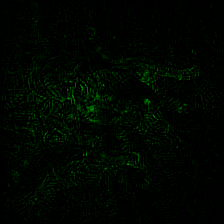

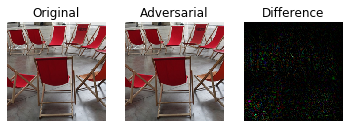

label: folding chair
prediction before attack: folding chair
prediction after attack: drum, membranophone, tympan


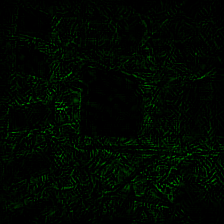

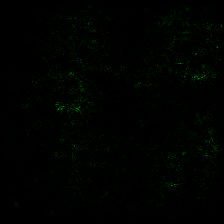

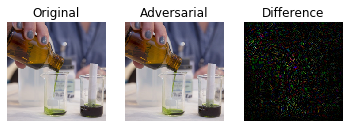

label: beaker
prediction before attack: beaker
prediction after attack: perfume, essence


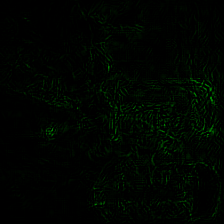

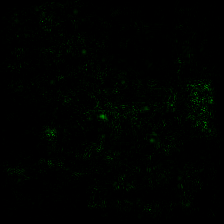

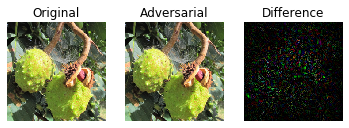

label: buckeye, horse chestnut, conker
prediction before attack: buckeye, horse chestnut, conker
prediction after attack: hip, rose hip, rosehip


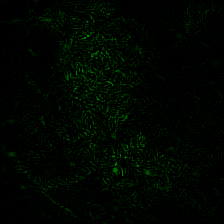

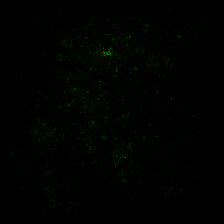

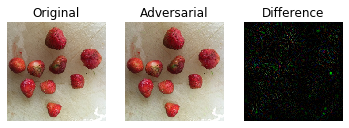

label: strawberry
prediction before attack: strawberry
prediction after attack: bottlecap


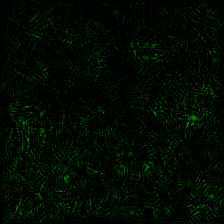

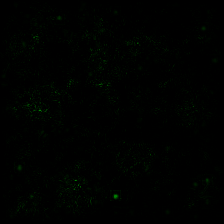

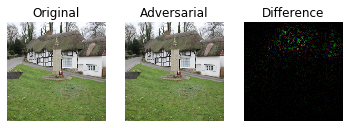

label: thatch, thatched roof
prediction before attack: thatch, thatched roof
prediction after attack: mobile home, manufactured home


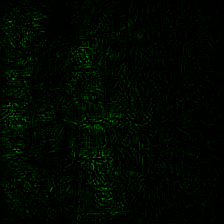

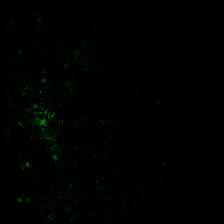

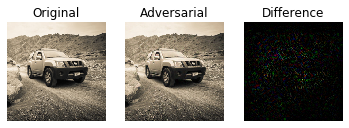

label: jeep, landrover
prediction before attack: jeep, landrover
prediction after attack: racer, race car, racing car


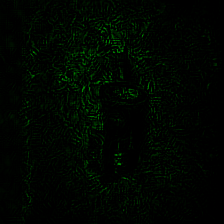

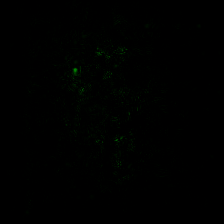

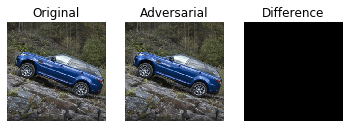

label: jeep, landrover
prediction before attack: racer, race car, racing car
prediction after attack: racer, race car, racing car


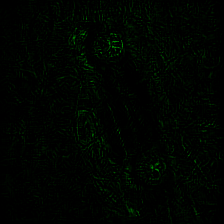

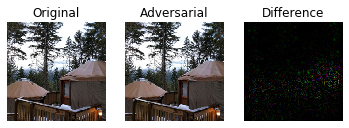

label: yurt
prediction before attack: yurt
prediction after attack: apiary, bee house


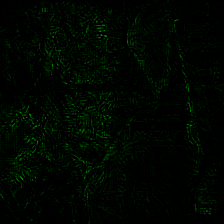

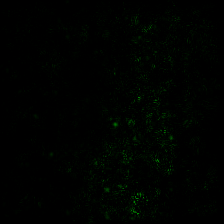

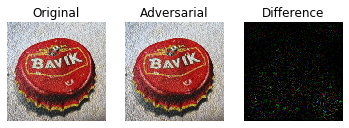

label: bottlecap
prediction before attack: bottlecap
prediction after attack: purse


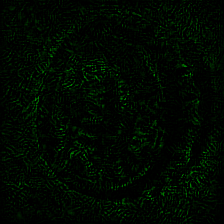

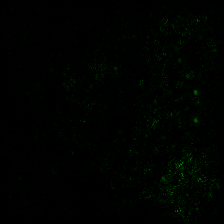

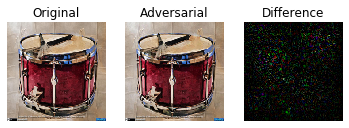

label: drum, membranophone, tympan
prediction before attack: drum, membranophone, tympan
prediction after attack: mailbag, postbag


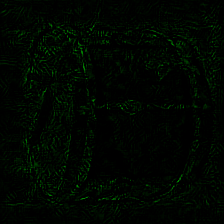

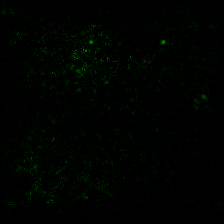

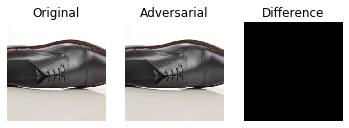

label: Loafer
prediction before attack: sunglasses, dark glasses, shades
prediction after attack: sunglasses, dark glasses, shades


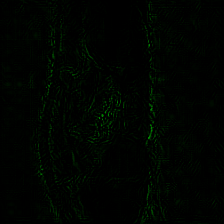

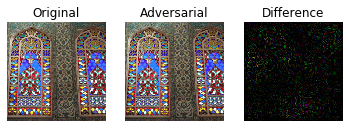

label: prayer rug, prayer mat
prediction before attack: prayer rug, prayer mat
prediction after attack: bottlecap


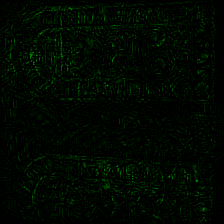

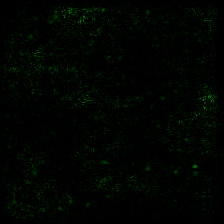

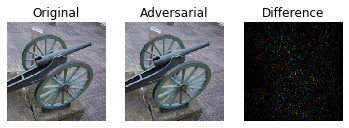

label: cannon
prediction before attack: cannon
prediction after attack: manhole cover


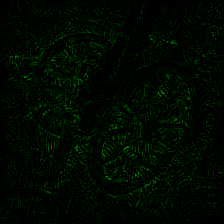

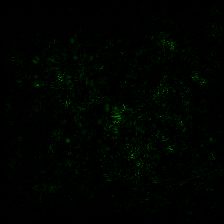

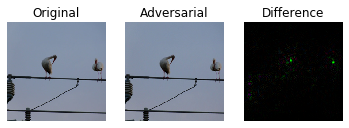

label: spoonbill
prediction before attack: spoonbill
prediction after attack: white stork, Ciconia ciconia


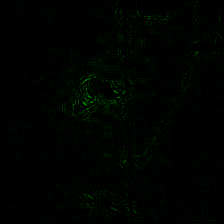

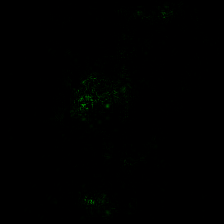

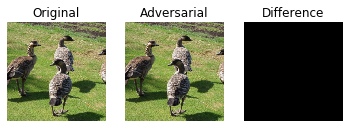

label: goose
prediction before attack: vulture
prediction after attack: vulture


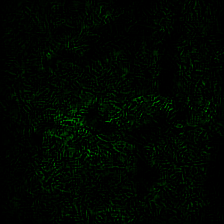

Initial accuracy: 0.75 (12/16)
Foolbox attack model: GaussianBlurAttack
Failed adversarials: 0/12


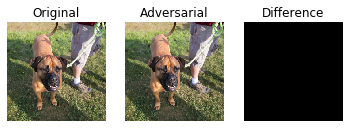

label: bull mastiff
prediction before attack: boxer
prediction after attack: boxer


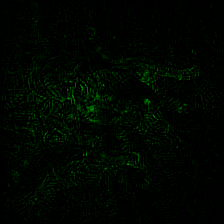

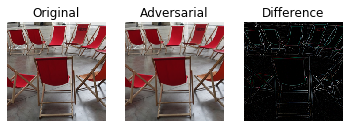

label: folding chair
prediction before attack: folding chair
prediction after attack: dining table, board


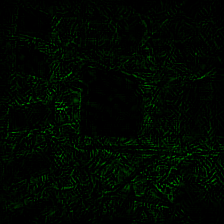

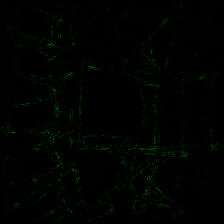

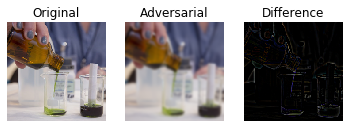

label: beaker
prediction before attack: beaker
prediction after attack: torch


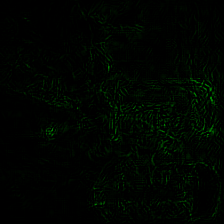

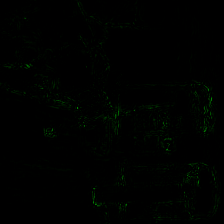

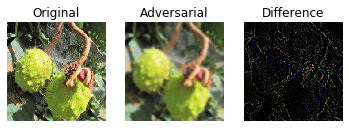

label: buckeye, horse chestnut, conker
prediction before attack: buckeye, horse chestnut, conker
prediction after attack: acorn


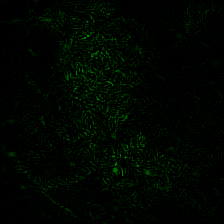

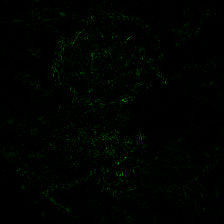

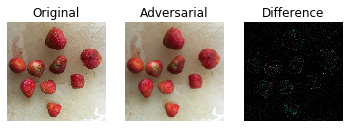

label: strawberry
prediction before attack: strawberry
prediction after attack: pomegranate


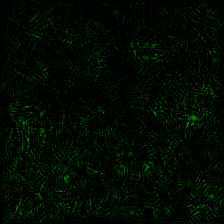

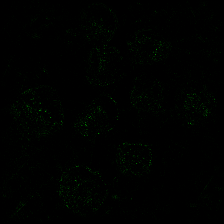

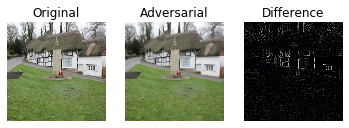

label: thatch, thatched roof
prediction before attack: thatch, thatched roof
prediction after attack: mobile home, manufactured home


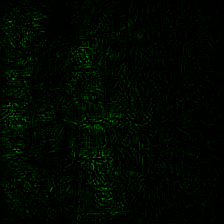

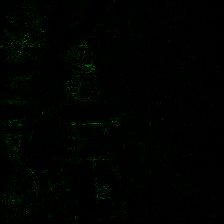

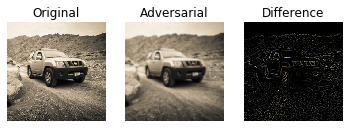

label: jeep, landrover
prediction before attack: jeep, landrover
prediction after attack: racer, race car, racing car


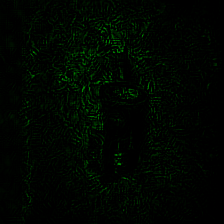

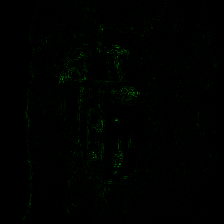

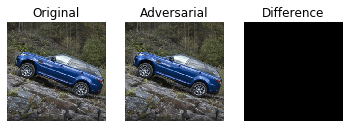

label: jeep, landrover
prediction before attack: racer, race car, racing car
prediction after attack: racer, race car, racing car


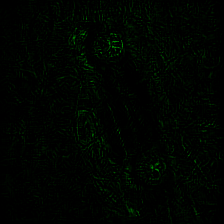

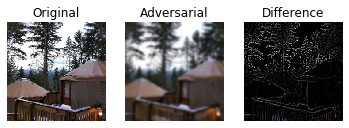

label: yurt
prediction before attack: yurt
prediction after attack: indri, indris, Indri indri, Indri brevicaudatus


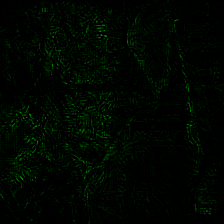

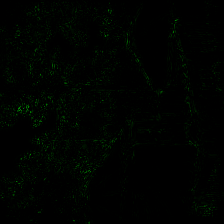

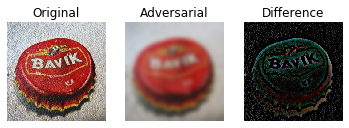

label: bottlecap
prediction before attack: bottlecap
prediction after attack: ping-pong ball


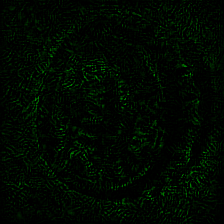

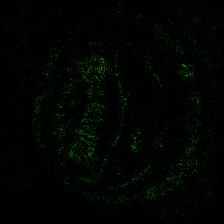

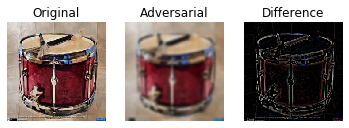

label: drum, membranophone, tympan
prediction before attack: drum, membranophone, tympan
prediction after attack: cocktail shaker


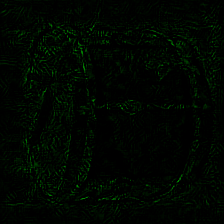

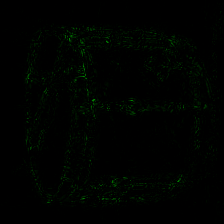

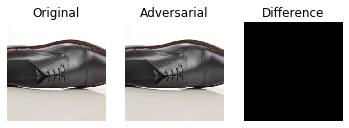

label: Loafer
prediction before attack: sunglasses, dark glasses, shades
prediction after attack: sunglasses, dark glasses, shades


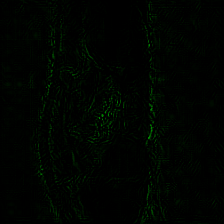

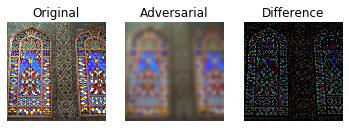

label: prayer rug, prayer mat
prediction before attack: prayer rug, prayer mat
prediction after attack: bubble


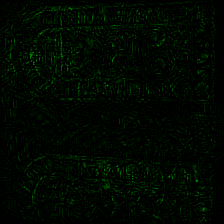

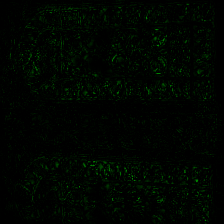

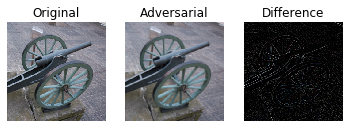

label: cannon
prediction before attack: cannon
prediction after attack: moped


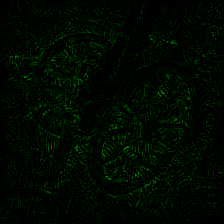

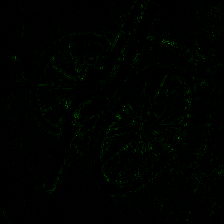

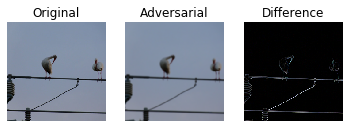

label: spoonbill
prediction before attack: spoonbill
prediction after attack: horizontal bar, high bar


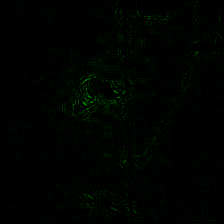

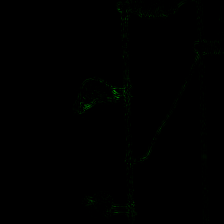

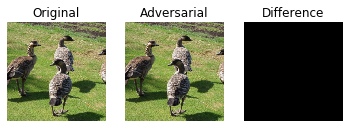

label: goose
prediction before attack: vulture
prediction after attack: vulture


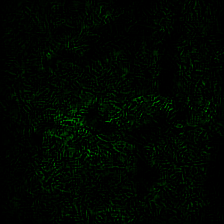

Initial accuracy: 0.75 (12/16)
Foolbox attack model: BinarizationRefinementAttack
Failed adversarials: 12/12


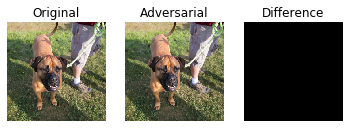

label: bull mastiff
prediction before attack: boxer
prediction after attack: boxer


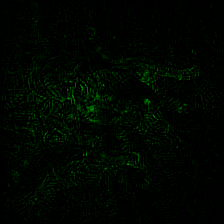

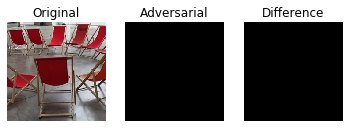

label: folding chair
prediction before attack: folding chair
prediction after attack: tench, Tinca tinca


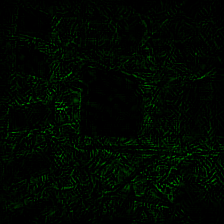

IndexError: index 0 is out of bounds for axis 0 with size 0

In [98]:
for model in key_models[:1]:
    pymodel = eval('models.%s(pretrained=True)' % model)
    pymodel.eval()
    print('Using model:', model)
    print(pymodel)
    for attack in key_attacks:
        explore(pymodel, attack)